In [28]:
from neuprint import Client
from neuprint import fetch_skeleton, fetch_synapse_connections, SynapseCriteria as SC
from util import *

auth_token_file = open("flybrain.auth.txt", 'r')
auth_token = next(auth_token_file).strip()
try:
    np_client = Client('neuprint.janelia.org', dataset='hemibrain:v1.2.1', token=auth_token)
    log_msg("neuprint Client set up as `np_Client`, version", np_client.fetch_version())
except:
    np_client = None
    log_msg("neuprint Client set up failed!")

2023 11 17 18:09:33  neuprint Client set up as `np_Client`, version 0.1.0


In [34]:
ovi_crit = SC(rois=['SMP(R)', 'EB', 'NO', 'PB', 'LAL(R)', 'CRE(R)', 'LH(R)', 'FB', 'SCL(R)'], primary_only=False)
fetch_synapse_connections(423101189, None, ovi_crit)

  0%|          | 0/22530 [00:00<?, ?it/s]

HTTPError: Error accessing POST https://neuprint.janelia.org/api/custom/custom

Cypher was:


    MATCH (n:Segment)-[e:ConnectsTo]->(m:Neuron),
          (n)-[:Contains]->(nss:SynapseSet)-[:ConnectsTo]->(mss:SynapseSet)<-[:Contains]-(m),
          (nss)-[:Contains]->(ns:Synapse)-[:SynapsesTo]->(ms:Synapse)<-[:Contains]-(mss)

    WHERE 
      // -- Basic conditions for segment 'n' --
      n.bodyId = 423101189
      AND (n.`CRE(R)` OR n.`EB` OR n.`FB` OR n.`LAL(R)` OR n.`LH(R)` OR n.`NO` OR n.`PB` OR n.`SCL(R)` OR n.`SMP(R)`)
      AND
      // -- Basic conditions for segment 'm' --
      (m.`CRE(R)` OR m.`EB` OR m.`FB` OR m.`LAL(R)` OR m.`LH(R)` OR m.`NO` OR m.`PB` OR m.`SCL(R)` OR m.`SMP(R)`)

    // Note: Semantically, the word 'DISTINCT' is unnecessary here,
    // but its presence makes this query run faster.
    WITH DISTINCT n, m, ns, ms, e
    WHERE e.weight >= 1

    // -- Filter synapse 'ns' --
    WITH n, m, ns, ms
    WHERE (ns.type = 'pre')

    // -- Filter synapse 'ms' --
    WITH n, m, ns, ms
    WHERE (ms.`SMP(R)` OR ms.`EB` OR ms.`NO` OR ms.`PB` OR ms.`LAL(R)` OR ms.`CRE(R)` OR ms.`LH(R)` OR ms.`FB` OR ms.`SCL(R)`) AND (ms.type = 'post')


    RETURN n.bodyId as bodyId_pre,
           m.bodyId as bodyId_post,
           ns.location.x as ux,
           ns.location.y as uy,
           ns.location.z as uz,
           ms.location.x as dx,
           ms.location.y as dy,
           ms.location.z as dz,
           ns.confidence as confidence_pre,
           ms.confidence as confidence_post,
           apoc.map.removeKeys(ns, ['location', 'confidence', 'type']) as info_pre,
           apoc.map.removeKeys(ms, ['location', 'confidence', 'type']) as info_post


Returned Error (400):

Timeout experienced.  This could be due to database traffic or to non-optimal database queries. If the latter, please consult neuPrint documentation or post a question at https://groups.google.com/forum/#!forum/neuprint to understand other options.

In [20]:
import navis.interfaces.neuprint as neu
import navis

# Connect to the neuprint server
client = neu.Client('https://neuprint.janelia.org/', dataset='hemibrain:v1.2.1', token=auth_token)

# Fetch the oviIN skeleton
skeleton = neu.fetch_skeleton(423101189, with_synapses = True, format='swc', heal=True)

# Region of interest
smp = neu.fetch_roi('SMP(R)')

# Print the skeleton
#print(skeleton)


TypeError: fetch_skeleton() got an unexpected keyword argument 'with_synapses'

In [19]:
fig = navis.plot3d([s, smp])

In [5]:
# Creates a tree neuron object from the skeleton
s = navis.TreeNeuron(skeleton, name = 'oviIN')
s

,
type,navis.TreeNeuron
name,oviIN
n_nodes,84244
n_connectors,None
n_branches,6883
n_leafs,7019
cable_length,3797422.0
soma,None
units,1 dimensionless
created_at,2023-11-17 17:49:32.566189


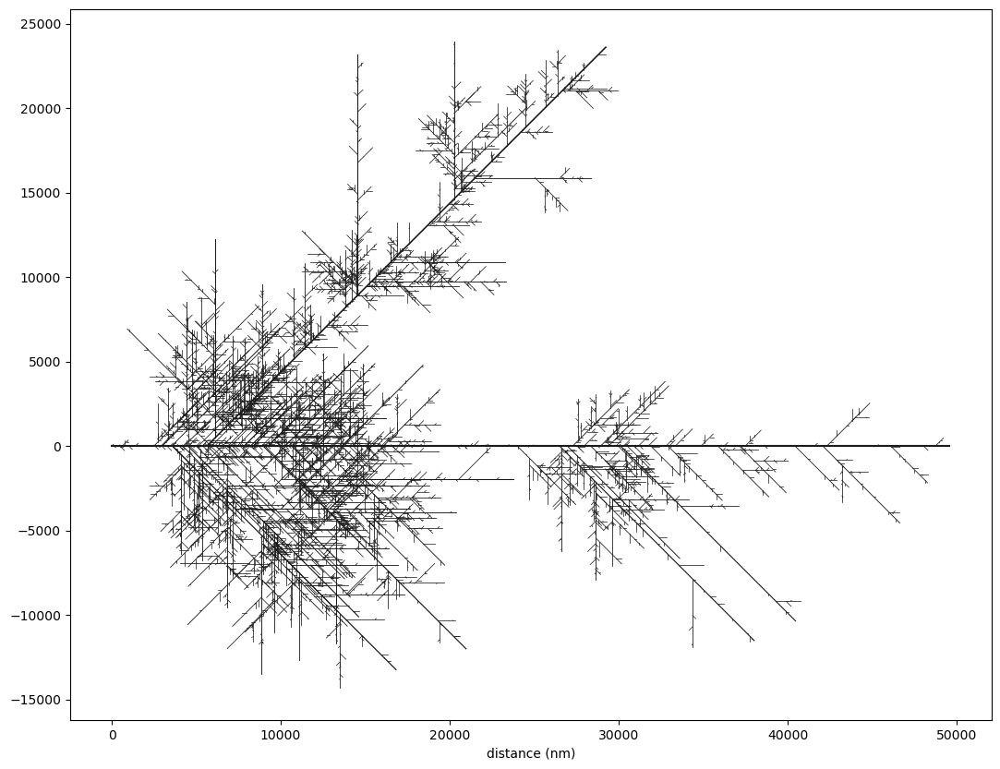

In [12]:
ax, pos = navis.plot_flat(s, layout='subway', connectors=False)
_ = ax.set_xlabel('distance (nm)')
_ = ax.figure.set_size_inches(50, 10)